In [30]:
import numpy as np 
import pandas as pd
import tensorflow as tf
from keras import backend as K
from tensorflow import keras
import matplotlib.pyplot as plt
from glob import glob
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
from skimage.io import imread, imshow
from skimage.transform import resize
from sklearn.model_selection import train_test_split  

from tensorflow.python.keras.utils.np_utils import to_categorical
from tqdm import tqdm
from IPython import display

In [2]:
'''
Extract features from images '''
path="DATA_AGRICULTURE/"
l=glob(path+"*")
s=len(glob(path+"*"))
extract=[]
print(l[0][17:])
flat_data_arr=[] #input array
target_arr=[] #output array
for i in l:
    p=glob(i+"/"+"*.*")
    
    for j in p:
        #print(j)
        
        s=imread(j,as_gray=True)
        s=resize(s,(50,50))
        #print(s.dtype,len(s))
        
        '''
        mean = np.mean(s, axis=(1,2), keepdims=True)
        std = np.std(s, axis=(1,2), keepdims=True)
        img_std = (s - mean) / std
        '''
        extract.append([np.array(s),i[17:]])

    
#df=pd.DataFrame(flat_data) #dataframe
#df['Target']=target




septoria


In [3]:
extract[0][0].dtype

dtype('float64')

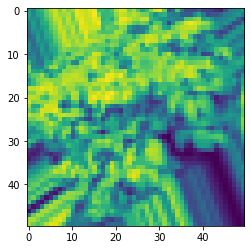

In [4]:
plt.imshow(extract[1000][0])

In [11]:
x=[]
y=[]
for features,class_value in extract:
    x.append(features)
    y.append(class_value)



In [12]:
x=np.array(x).reshape(-1,50,50,1)
x.shape


(1198, 50, 50, 1)

In [13]:
'''
x=df.iloc[:,0] #input data 
y=df.iloc[:,1] #output data
print(x)
'''



lb=LabelEncoder()
y=to_categorical(lb.fit_transform(y))


In [14]:
x_train, x_test, y_train, y_test =train_test_split(x, y, test_size=0.30,random_state=12)
print(x_train.shape)

(838, 50, 50, 1)


In [31]:
K.clear_session()

In [32]:
# code
num_features = 100

generator = keras.models.Sequential([
	keras.layers.Dense(5 * 5* 128, input_shape =(50,)),
	keras.layers.Reshape([5, 5, 128]),
	keras.layers.BatchNormalization(),
	keras.layers.Conv2DTranspose(
		64, (5, 5), (2, 2), padding ="same", activation ="selu"),
	keras.layers.BatchNormalization(),
	keras.layers.Conv2DTranspose(
		1, (5, 5), (5, 5), padding ="same", activation ="tanh"),
])
generator.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 3200)              163200    
                                                                 
 reshape (Reshape)           (None, 5, 5, 128)         0         
                                                                 
 batch_normalization (BatchN  (None, 5, 5, 128)        512       
 ormalization)                                                   
                                                                 
 conv2d_transpose (Conv2DTra  (None, 10, 10, 64)       204864    
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 10, 10, 64)       256       
 hNormalization)                                                 
                                                        

In [33]:
discriminator = keras.models.Sequential([
	keras.layers.Conv2D(64, (5, 5), (2, 2), padding ="same", input_shape =[50, 50, 1]),
	keras.layers.LeakyReLU(0.2),
	keras.layers.Dropout(0.3),
	keras.layers.Conv2D(128, (5, 5), (2, 2), padding ="same"),
	keras.layers.LeakyReLU(0.2),
	keras.layers.Dropout(0.3),
	keras.layers.Flatten(),
	keras.layers.Dense(1, activation ='sigmoid')
])
discriminator.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 25, 25, 64)        1664      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 25, 25, 64)        0         
                                                                 
 dropout (Dropout)           (None, 25, 25, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 128)       204928    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 13, 13, 128)       0         
                                                                 
 dropout_1 (Dropout)         (None, 13, 13, 128)       0         
                                                                 
 flatten (Flatten)           (None, 21632)            

In [34]:
discriminator.compile(loss ="binary_crossentropy", optimizer ="adam")
# make  discriminator no-trainable as of  now
discriminator.trainable = False
# Combine both generator and discriminator
gan = keras.models.Sequential([generator, discriminator])
# compile generator using binary cross entropy loss and adam optimizer
 
gan.compile(loss ="binary_crossentropy", optimizer ="adam")

In [35]:
def generate_and_save_images(model, epoch, test_input):
  predictions = model(test_input, training = False)
 
  fig = plt.figure(figsize =(10, 10))
 
  for i in range(25):
      plt.subplot(5, 5, i + 1)
      plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap ='binary')
      plt.axis('off')
 
  plt.savefig('image_epoch_{:04d}.png'.format(epoch))

In [51]:
batch_size = 32
seed = tf.random.normal(shape =[batch_size,50])

def train_dcgan(gan, dataset, batch_size, num_features, epochs = 5):
	generator, discriminator = gan.layers
	for epoch in tqdm(range(epochs)):
		print()
		print("Epoch {}/{}".format(epoch + 1, epochs))

		for X_batch in dataset:
			# create a random noise of sizebatch_size * 100
			# to passit into the generator
			noise = tf.random.normal(shape =[batch_size, num_features])
			generated_images = generator(noise)

			# take batch of generated image and real image and
			# use them to train the discriminator
			X_fake_and_real = tf.concat([generated_images, X_batch], axis = 0)
			y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
			discriminator.trainable = True
			discriminator.train_on_batch(X_fake_and_real, y1)

			# Here we will be training our GAN model, in this step
			# we pass noise that uses generatortogenerate the image
			# and pass it with labels as [1] So, it can fool the discriminator
			noise = tf.random.normal(shape =[batch_size, num_features])
			y2 = tf.constant([[1.]] * batch_size)
			discriminator.trainable = False
			gan.train_on_batch(noise, y2)

			# generate images for the GIF as we go
			generate_and_save_images(generator, epoch + 1, seed)



In [48]:
# reshape to add a color map
x_train_dcgan = x_train.reshape(-1, 50, 50, 1) * 2. - 1.
# create batches
# callthe training function with 10 epochs and record time %% time
print(x_train_dcgan.shape)
X1= tf.cast(x_train_dcgan, tf.float32) 
def create_batch(x_train):
  dataset = tf.data.Dataset.from_tensor_slices(x_train).shuffle(800)
  # Combines consecutive elements of this dataset into batches.
 
  dataset = dataset.batch(batch_size, drop_remainder = True).prefetch(2)
  # Creates a Dataset that prefetches elements from this dataset
  return dataset

(838, 50, 50, 1)


In [52]:
dataset=create_batch(X1)
dataset
#X1

<PrefetchDataset element_spec=TensorSpec(shape=(32, 50, 50, 1), dtype=tf.float32, name=None)>

  0%|          | 0/10 [00:00<?, ?it/s]


Epoch 1/10


/tmp/ipykernel_3706/955429030.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize =(10, 10))
 10%|█         | 1/10 [00:44<06:42, 44.71s/it]


Epoch 2/10


 20%|██        | 2/10 [01:21<05:18, 39.81s/it]


Epoch 3/10


 30%|███       | 3/10 [01:58<04:31, 38.72s/it]


Epoch 4/10


 40%|████      | 4/10 [02:35<03:47, 37.92s/it]


Epoch 5/10


 50%|█████     | 5/10 [03:26<03:34, 42.89s/it]


Epoch 6/10


 60%|██████    | 6/10 [04:01<02:40, 40.10s/it]


Epoch 7/10


 70%|███████   | 7/10 [04:44<02:03, 41.02s/it]


Epoch 8/10


 80%|████████  | 8/10 [05:26<01:22, 41.36s/it]


Epoch 9/10


 90%|█████████ | 9/10 [06:00<00:38, 38.93s/it]


Epoch 10/10


100%|██████████| 10/10 [06:33<00:00, 39.37s/it]


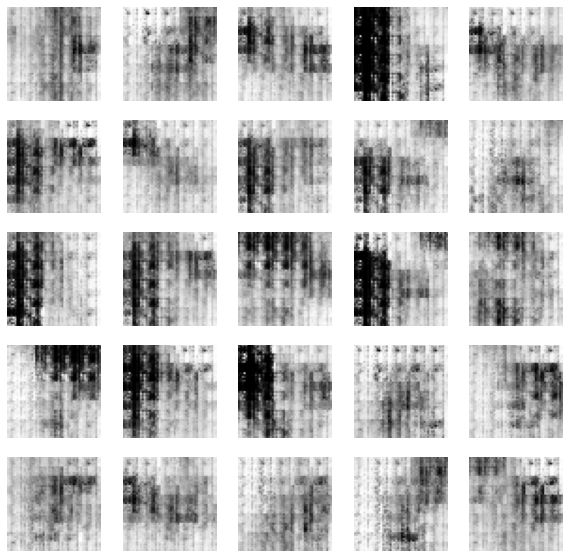

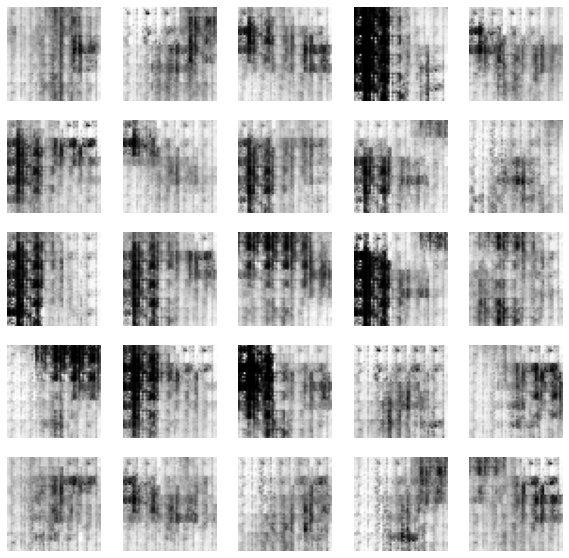

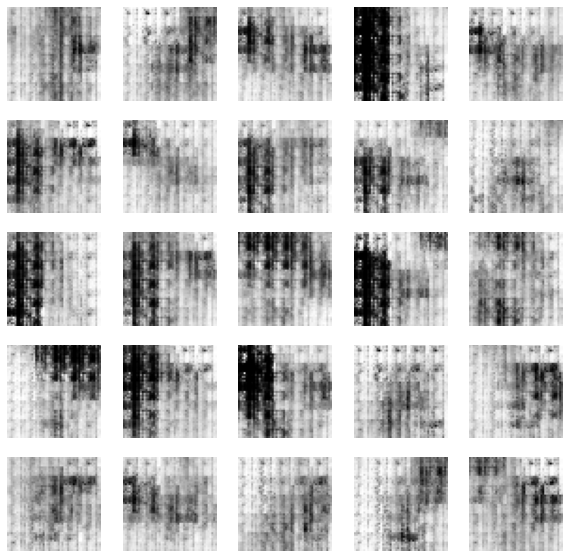

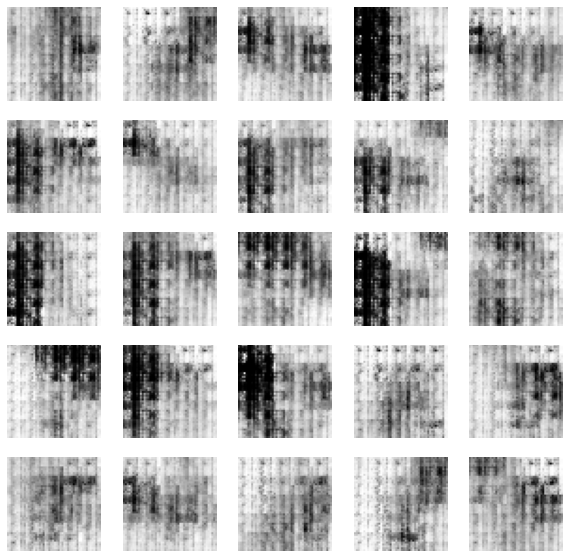

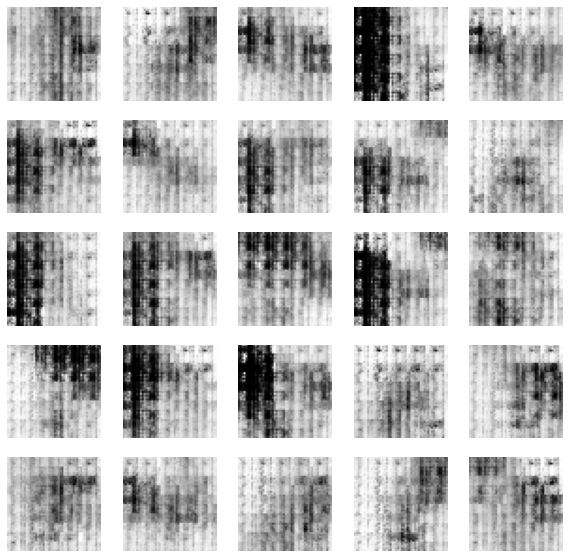

...

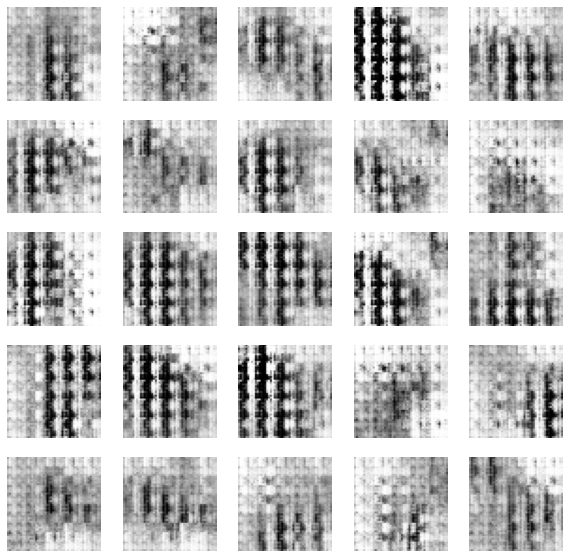

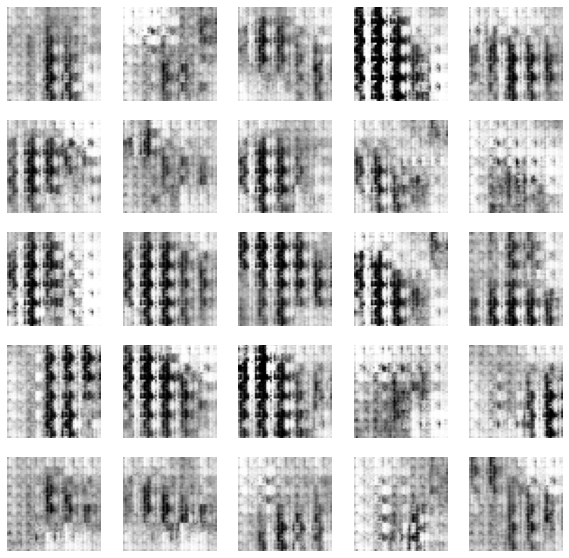

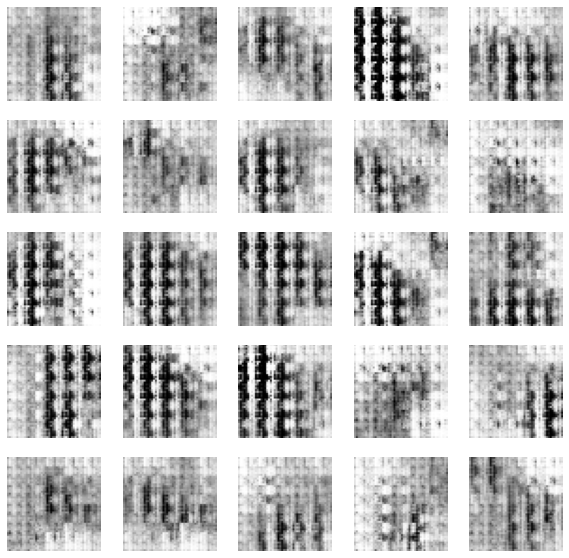

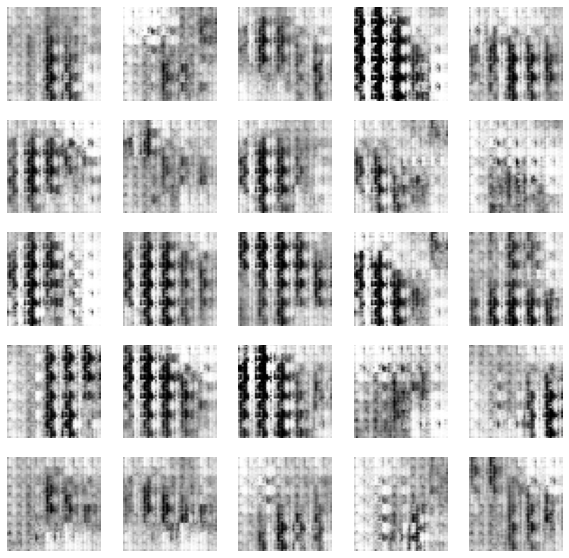

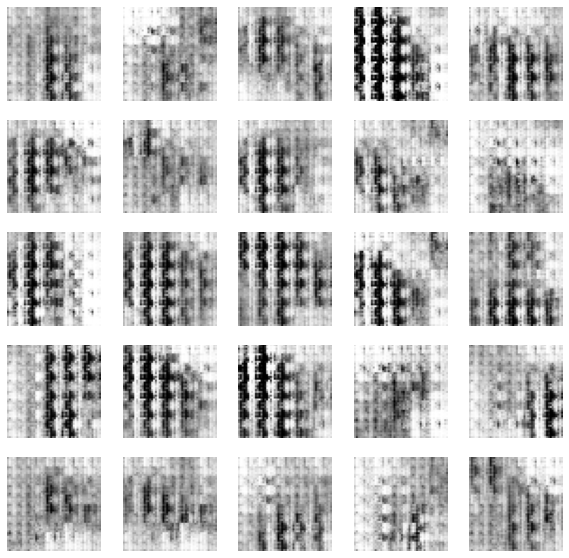

In [53]:
train_dcgan(gan, dataset, batch_size,50, epochs = 10)

In [43]:
seed = tf.random.normal(shape =[batch_size,50])
pred=generator(seed,training=False)


In [44]:
m=tf.keras.metrics.Accuracy()
m.update_state(X1[:32],pred)
m.result().numpy()

0.0